In [1]:
import running_mcs_stats_flextrkrERA5 as rms1

In [2]:
rms1.main()

year 2004 done
year 2005 done
year 2006 done
year 2007 done
year 2008 done
year 2009 done
year 2010 done
year 2011 done
year 2012 done
year 2013 done
year 2014 done
year 2015 done
year 2004 done
year 2005 done
year 2006 done
year 2007 done
year 2008 done
year 2009 done
year 2010 done
year 2011 done
year 2012 done
year 2013 done
year 2014 done
year 2015 done
year 2004 done
year 2005 done
year 2006 done
year 2007 done
year 2008 done
year 2009 done
year 2010 done
year 2011 done
year 2012 done
year 2013 done
year 2014 done
year 2015 done
year 2004 done
year 2005 done
year 2006 done
year 2007 done
year 2008 done
year 2009 done
year 2010 done
year 2011 done
year 2012 done
year 2013 done
year 2014 done
year 2015 done


In [3]:
import running_mcs_stats_flextrkrID1H as rms2

In [4]:
rms2.main()

year 2004 done
year 2005 done
year 2006 done
year 2007 done
year 2008 done
year 2009 done
year 2010 done
year 2011 done
year 2012 done
year 2013 done
year 2014 done
year 2015 done
year 2004 done
year 2005 done
year 2006 done
year 2007 done
year 2008 done
year 2009 done
year 2010 done
year 2011 done
year 2012 done
year 2013 done
year 2014 done
year 2015 done


In [1]:
import matplotlib.pyplot as plt
import xarray as xr
from config import main_path_era
import numpy as np
import matplotlib as mpl

from config import us_states_location
from visualize import create_STATES
import cartopy.crs as ccrs
import cartopy.feature as cf

STATES = create_STATES(us_states_location)

In [2]:
years = [2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015]

In [3]:
era5_3pctl_cld_totalmcs = np.zeros((12,len(years)))
era5_3pctl_pcp_totalmcs = np.zeros((12,len(years)))
era5_15pctl_cld_totalmcs = np.zeros((12,len(years)))
era5_15pctl_pcp_totalmcs = np.zeros((12,len(years)))
imerg_cld_totalmcs = np.zeros((12,len(years)))
imerg_pcp_totalmcs = np.zeros((12,len(years)))

for num, yr in enumerate(years):
    # era5
    era5_3pctl_cld = xr.open_dataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_3pctl/mcs_stats_cloudtracknumber_{str(yr)}.nc')
    era5_3pctl_cld_totalmcs[num] = era5_3pctl_cld['tracked_total'].values
    era5_3pctl_pcp = xr.open_dataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_3pctl/mcs_stats_pcptracknumber_{str(yr)}.nc')
    era5_3pctl_pcp_totalmcs[num] = era5_3pctl_pcp['tracked_total'].values
    era5_15pctl_cld = xr.open_dataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_15pctl/mcs_stats_cloudtracknumber_{str(yr)}.nc')
    era5_15pctl_cld_totalmcs[num] = era5_15pctl_cld['tracked_total'].values
    era5_15pctl_pcp = xr.open_dataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_15pctl/mcs_stats_pcptracknumber_{str(yr)}.nc')
    era5_15pctl_pcp_totalmcs[num] = era5_15pctl_pcp['tracked_total'].values
    # imerg
    imerg_cld = xr.open_dataset(f'{main_path_era}/dl_files/1H/mcs_stats_cloudtracknumber_{str(yr)}.nc')
    imerg_cld_totalmcs[num] = imerg_cld['tracked_total'].values
    imerg_pcp = xr.open_dataset(f'{main_path_era}/dl_files/1H/mcs_stats_pcptracknumber_{str(yr)}.nc')
    imerg_pcp_totalmcs[num] = imerg_pcp['tracked_total'].values

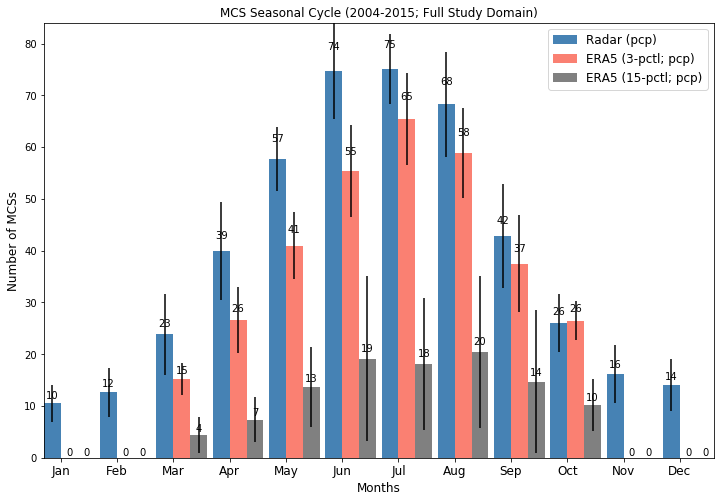

In [4]:
N = 12

#bar1 = np.nanmean(era5_3pctl_cld_totalmcs,axis=0)
bar2 = np.nanmean(era5_3pctl_pcp_totalmcs,axis=0)
#bar3 = np.nanmean(era5_15pctl_cld_totalmcs,axis=0)
bar4 = np.nanmean(era5_15pctl_pcp_totalmcs,axis=0)
#bar5 = np.nanmean(imerg_cld_totalmcs,axis=0)
bar6 = np.nanmean(imerg_pcp_totalmcs,axis=0)

#bar1_std = np.nanstd(era5_3pctl_cld_totalmcs,axis=0)
bar2_std = np.nanstd(era5_3pctl_pcp_totalmcs,axis=0)
#bar3_std = np.nanstd(era5_15pctl_cld_totalmcs,axis=0)
bar4_std = np.nanstd(era5_15pctl_pcp_totalmcs,axis=0)
#bar5_std = np.nanstd(imerg_cld_totalmcs,axis=0)
bar6_std = np.nanstd(imerg_pcp_totalmcs,axis=0)

#bar1_std = np.where(bar1==0, 0, bar1_std)
bar2_std = np.where(bar2==0, 0, bar2_std)
#bar3_std = np.where(bar3==0, 0, bar3_std)
bar4_std = np.where(bar4==0, 0, bar4_std)
#bar5_std = np.where(bar5==0, 0, bar5_std)
bar6_std = np.where(bar6==0, 0, bar6_std)

ind = np.arange(N)  # the x locations for the groups
width = 0.3       # the width of the bars

fig, ax = plt.subplots(figsize=(12,8))

# era5 3 pctl
#rects1 = ax.bar(ind + width*2, bar1, width, color='r', yerr=bar1_std)
rects2 = ax.bar(ind + width, bar2, width, color='salmon', yerr=bar2_std)
# era5 15 pctl
#rects3 = ax.bar(ind + width*4, bar3, width, color='b', yerr=bar3_std)
rects4 = ax.bar(ind + width*2, bar4, width, color='grey', yerr=bar4_std)
# imerg
#rects5 = ax.bar(ind, bar5, width, color='k', yerr=bar5_std)
rects6 = ax.bar(ind, bar6, width, color='steelblue', yerr=bar6_std)

# add some text for labels, title and axes ticks
ax.set_ylabel('Number of MCSs', fontsize=12)
ax.set_xlabel('Months', fontsize=12)
ax.set_title('MCS Seasonal Cycle (2004-2015; Full Study Domain)', fontsize=12)
ax.set_xticks(ind + width / 2)
ax.set_xticklabels(('Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'), fontsize=12)

ax.legend((rects6[0], rects2[0], rects4[0]), 
          ('Radar (pcp)', 'ERA5 (3-pctl; pcp)', 'ERA5 (15-pctl; pcp)'), fontsize=12)

ax.margins(x=0,y=0)

def autolabel(rects):
    """
    Attach a text label above each bar displaying its height
    """
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2., 1.05*height,
                '%d' % int(height),
                ha='center', va='bottom')

#autolabel(rects1)
autolabel(rects2)
#autolabel(rects3)
autolabel(rects4)
#autolabel(rects5)
autolabel(rects6)

plt.savefig('/glade/work/molina/DATA/temp_figs/mcs_compare_fig1.png', bbox_inches='tight', dpi=200)
plt.show()

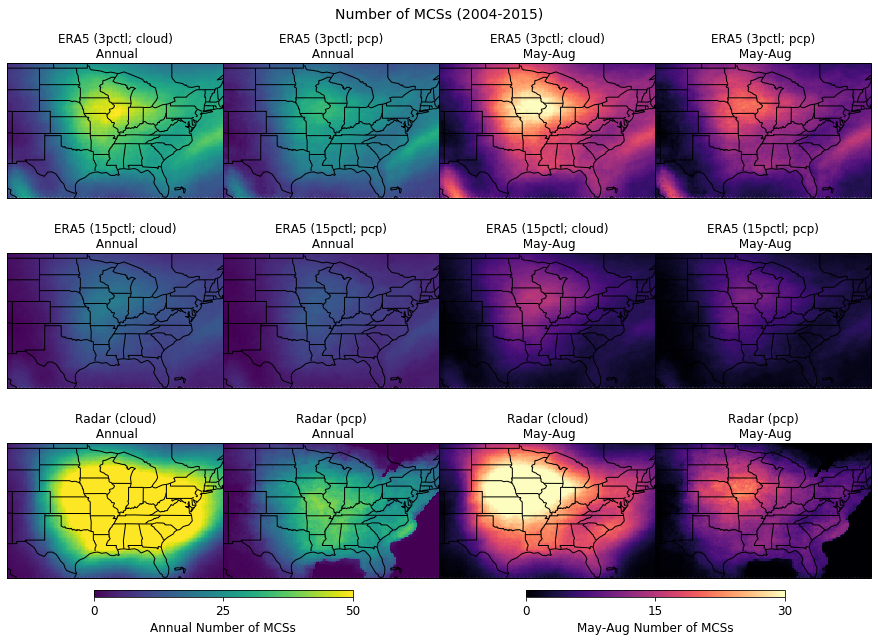

In [5]:
# era5
era5_3pctl_cld = xr.open_mfdataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_3pctl/mcs_stats_cloudtracknumber_*.nc',
                                  combine='by_coords')['tracked_total_grid']
era5_3pctl_pcp = xr.open_mfdataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_3pctl/mcs_stats_pcptracknumber_*.nc',
                                  combine='by_coords')['tracked_total_grid']
era5_15pctl_cld = xr.open_mfdataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_15pctl/mcs_stats_cloudtracknumber_*.nc',
                                  combine='by_coords')['tracked_total_grid']
era5_15pctl_pcp = xr.open_mfdataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_15pctl/mcs_stats_pcptracknumber_*.nc',
                                  combine='by_coords')['tracked_total_grid']
# imerg
imerg_cld = xr.open_mfdataset(f'{main_path_era}/dl_files/1H/mcs_stats_cloudtracknumber_*.nc',
                                  combine='by_coords')['tracked_total_grid']
imerg_pcp = xr.open_mfdataset(f'{main_path_era}/dl_files/1H/mcs_stats_pcptracknumber_*.nc',
                                  combine='by_coords')['tracked_total_grid']

vmin1 = 0
vmax1 = 50
cmap1 = "viridis"

vmin2 = 0
vmax2 = 30
cmap2 = "magma"

# create fig
fig = plt.figure(figsize=(12.,8.))

# create plots
fig.suptitle("Number of MCSs (2004-2015)", fontsize=14, y=1.)


ax1 = fig.add_axes([0.0, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax1.set_title('ERA5 (3pctl; cloud)\n Annual', fontsize=12)
ax1.pcolormesh(era5_3pctl_cld['lon'], era5_3pctl_cld['lat'], 
               era5_3pctl_cld.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax1.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax1.add_feature(cf.BORDERS)
ax1.margins(x=0,y=0)
ax1.coastlines()


ax2 = fig.add_axes([0.25, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax2.set_title('ERA5 (3pctl; pcp)\n Annual', fontsize=12)
ax2.pcolormesh(era5_3pctl_pcp['lon'], era5_3pctl_pcp['lat'], 
               era5_3pctl_pcp.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax2.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax2.add_feature(cf.BORDERS)
ax2.margins(x=0,y=0)
ax2.coastlines()


ax3 = fig.add_axes([0.5, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax3.set_title('ERA5 (3pctl; cloud)\n May-Aug', fontsize=12)
ax3.pcolormesh(era5_3pctl_cld['lon'], era5_3pctl_cld['lat'], 
               era5_3pctl_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax3.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax3.add_feature(cf.BORDERS)
ax3.margins(x=0,y=0)
ax3.coastlines()


ax4 = fig.add_axes([0.75, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax4.set_title('ERA5 (3pctl; pcp)\n May-Aug', fontsize=12)
ax4.pcolormesh(era5_3pctl_pcp['lon'], era5_3pctl_pcp['lat'], 
               era5_3pctl_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax4.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax4.add_feature(cf.BORDERS)
ax4.margins(x=0,y=0)
ax4.coastlines()



ax5 = fig.add_axes([0.0, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax5.set_title('ERA5 (15pctl; cloud)\n Annual', fontsize=12)
ax5.pcolormesh(era5_15pctl_cld['lon'], era5_15pctl_cld['lat'], 
               era5_15pctl_cld.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax5.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax5.add_feature(cf.BORDERS)
ax5.margins(x=0,y=0)
ax5.coastlines()


ax6 = fig.add_axes([0.25, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax6.set_title('ERA5 (15pctl; pcp)\n Annual', fontsize=12)
ax6.pcolormesh(era5_15pctl_pcp['lon'], era5_15pctl_pcp['lat'], 
               era5_15pctl_pcp.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax6.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax6.add_feature(cf.BORDERS)
ax6.margins(x=0,y=0)
ax6.coastlines()


ax7 = fig.add_axes([0.5, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax7.set_title('ERA5 (15pctl; cloud)\n May-Aug', fontsize=12)
ax7.pcolormesh(era5_15pctl_cld['lon'], era5_15pctl_cld['lat'], 
               era5_15pctl_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax7.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax7.add_feature(cf.BORDERS)
ax7.margins(x=0,y=0)
ax7.coastlines()


ax8 = fig.add_axes([0.75, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax8.set_title('ERA5 (15pctl; pcp)\n May-Aug', fontsize=12)
ax8.pcolormesh(era5_15pctl_pcp['lon'], era5_15pctl_pcp['lat'], 
               era5_15pctl_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax8.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax8.add_feature(cf.BORDERS)
ax8.margins(x=0,y=0)
ax8.coastlines()




ax9 = fig.add_axes([0.0, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax9.set_title('Radar (cloud)\n Annual', fontsize=12)
ax9.pcolormesh(imerg_cld['lon'], imerg_cld['lat'], 
               imerg_cld.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax9.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax9.add_feature(cf.BORDERS)
ax9.margins(x=0,y=0)
ax9.coastlines()


ax10 = fig.add_axes([0.25, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax10.set_title('Radar (pcp)\n Annual', fontsize=12)
ax10.pcolormesh(imerg_pcp['lon'], imerg_pcp['lat'], 
                imerg_pcp.sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax10.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax10.add_feature(cf.BORDERS)
ax10.margins(x=0,y=0)
ax10.coastlines()


ax11 = fig.add_axes([0.5, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax11.set_title('Radar (cloud)\n May-Aug', fontsize=12)
ax11.pcolormesh(imerg_cld['lon'], imerg_cld['lat'], 
                imerg_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax11.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax11.add_feature(cf.BORDERS)
ax11.margins(x=0,y=0)
ax11.coastlines()


ax12 = fig.add_axes([0.75, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax12.set_title('Radar (pcp)\n May-Aug', fontsize=12)
ax12.pcolormesh(imerg_pcp['lon'], imerg_pcp['lat'], 
                imerg_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax12.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax12.add_feature(cf.BORDERS)
ax12.margins(x=0,y=0)
ax12.coastlines()




# cbar
cbar_ax = fig.add_axes([0.1, -0.025, 0.3, 0.0125])
bounds = [vmin1,vmax1*0.5,vmax1]
newnorm=mpl.colors.Normalize(vmin=vmin1, vmax=vmax1)
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=plt.cm.get_cmap(cmap1),
                                 norm=newnorm,
                                 ticks=bounds,
                                 orientation='horizontal')
cbar.set_label('Annual Number of MCSs', fontsize=12) 
cbar.ax.tick_params(labelsize=12)

cbar_ax = fig.add_axes([0.6, -0.025, 0.3, 0.0125])
bounds = [vmin2,vmax2*0.5,vmax2]
newnorm=mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=plt.cm.get_cmap(cmap2),
                                 norm=newnorm,
                                 ticks=bounds,
                                 orientation='horizontal')
cbar.set_label('May-Aug Number of MCSs', fontsize=12) 
cbar.ax.tick_params(labelsize=12)

plt.savefig('/glade/work/molina/DATA/temp_figs/mcs_compare_fig2.png', bbox_inches='tight', dpi=200)
plt.show()

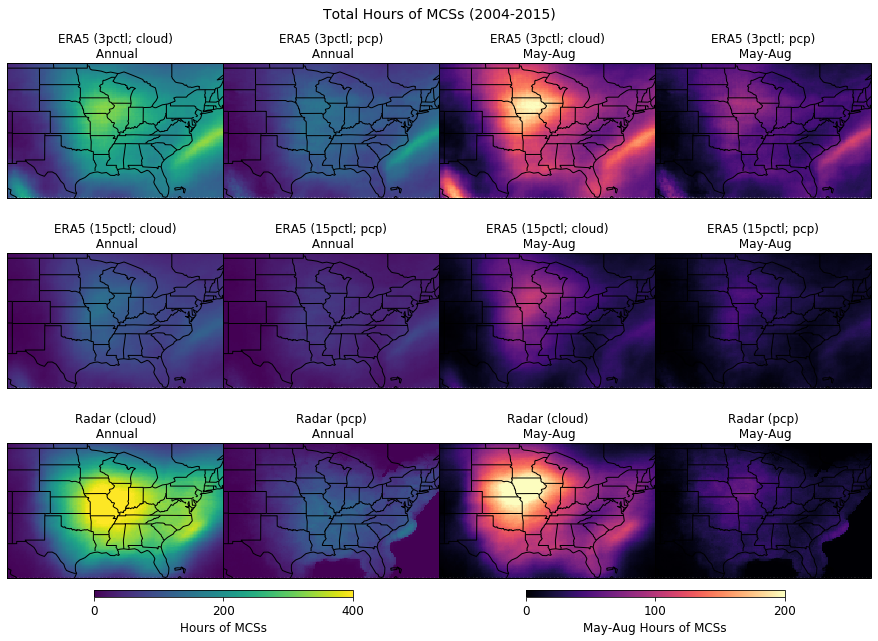

In [6]:
# era5
era5_3pctl_cld = xr.open_mfdataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_3pctl/mcs_stats_cloudtracknumber_*.nc',
                                  combine='by_coords')['nontracked_total_grid']
era5_3pctl_pcp = xr.open_mfdataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_3pctl/mcs_stats_pcptracknumber_*.nc',
                                  combine='by_coords')['nontracked_total_grid']
era5_15pctl_cld = xr.open_mfdataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_15pctl/mcs_stats_cloudtracknumber_*.nc',
                                  combine='by_coords')['nontracked_total_grid']
era5_15pctl_pcp = xr.open_mfdataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_15pctl/mcs_stats_pcptracknumber_*.nc',
                                  combine='by_coords')['nontracked_total_grid']
# imerg
imerg_cld = xr.open_mfdataset(f'{main_path_era}/dl_files/1H/mcs_stats_cloudtracknumber_*.nc',
                                  combine='by_coords')['nontracked_total_grid']
imerg_pcp = xr.open_mfdataset(f'{main_path_era}/dl_files/1H/mcs_stats_pcptracknumber_*.nc',
                                  combine='by_coords')['nontracked_total_grid']

vmin1 = 0
vmax1 = 400
cmap1 = "viridis"

vmin2 = 0
vmax2 = 200
cmap2 = "magma"

# create fig
fig = plt.figure(figsize=(12.,8.))

# create plots
fig.suptitle("Total Hours of MCSs (2004-2015)", fontsize=14, y=1.)


ax1 = fig.add_axes([0.0, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax1.set_title('ERA5 (3pctl; cloud)\n Annual', fontsize=12)
ax1.pcolormesh(era5_3pctl_cld['lon'], era5_3pctl_cld['lat'], 
               era5_3pctl_cld.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax1.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax1.add_feature(cf.BORDERS)
ax1.margins(x=0,y=0)
ax1.coastlines()


ax2 = fig.add_axes([0.25, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax2.set_title('ERA5 (3pctl; pcp)\n Annual', fontsize=12)
ax2.pcolormesh(era5_3pctl_pcp['lon'], era5_3pctl_pcp['lat'], 
               era5_3pctl_pcp.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax2.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax2.add_feature(cf.BORDERS)
ax2.margins(x=0,y=0)
ax2.coastlines()


ax3 = fig.add_axes([0.5, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax3.set_title('ERA5 (3pctl; cloud)\n May-Aug', fontsize=12)
ax3.pcolormesh(era5_3pctl_cld['lon'], era5_3pctl_cld['lat'], 
               era5_3pctl_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax3.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax3.add_feature(cf.BORDERS)
ax3.margins(x=0,y=0)
ax3.coastlines()


ax4 = fig.add_axes([0.75, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax4.set_title('ERA5 (3pctl; pcp)\n May-Aug', fontsize=12)
ax4.pcolormesh(era5_3pctl_pcp['lon'], era5_3pctl_pcp['lat'], 
               era5_3pctl_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax4.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax4.add_feature(cf.BORDERS)
ax4.margins(x=0,y=0)
ax4.coastlines()



ax5 = fig.add_axes([0.0, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax5.set_title('ERA5 (15pctl; cloud)\n Annual', fontsize=12)
ax5.pcolormesh(era5_15pctl_cld['lon'], era5_15pctl_cld['lat'], 
               era5_15pctl_cld.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax5.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax5.add_feature(cf.BORDERS)
ax5.margins(x=0,y=0)
ax5.coastlines()


ax6 = fig.add_axes([0.25, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax6.set_title('ERA5 (15pctl; pcp)\n Annual', fontsize=12)
ax6.pcolormesh(era5_15pctl_pcp['lon'], era5_15pctl_pcp['lat'], 
               era5_15pctl_pcp.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax6.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax6.add_feature(cf.BORDERS)
ax6.margins(x=0,y=0)
ax6.coastlines()


ax7 = fig.add_axes([0.5, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax7.set_title('ERA5 (15pctl; cloud)\n May-Aug', fontsize=12)
ax7.pcolormesh(era5_15pctl_cld['lon'], era5_15pctl_cld['lat'], 
               era5_15pctl_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax7.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax7.add_feature(cf.BORDERS)
ax7.margins(x=0,y=0)
ax7.coastlines()


ax8 = fig.add_axes([0.75, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax8.set_title('ERA5 (15pctl; pcp)\n May-Aug', fontsize=12)
ax8.pcolormesh(era5_15pctl_pcp['lon'], era5_15pctl_pcp['lat'], 
               era5_15pctl_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax8.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax8.add_feature(cf.BORDERS)
ax8.margins(x=0,y=0)
ax8.coastlines()




ax9 = fig.add_axes([0.0, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax9.set_title('Radar (cloud)\n Annual', fontsize=12)
ax9.pcolormesh(imerg_cld['lon'], imerg_cld['lat'], 
               imerg_cld.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax9.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax9.add_feature(cf.BORDERS)
ax9.margins(x=0,y=0)
ax9.coastlines()


ax10 = fig.add_axes([0.25, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax10.set_title('Radar (pcp)\n Annual', fontsize=12)
ax10.pcolormesh(imerg_pcp['lon'], imerg_pcp['lat'], 
                imerg_pcp.sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax10.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax10.add_feature(cf.BORDERS)
ax10.margins(x=0,y=0)
ax10.coastlines()


ax11 = fig.add_axes([0.5, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax11.set_title('Radar (cloud)\n May-Aug', fontsize=12)
ax11.pcolormesh(imerg_cld['lon'], imerg_cld['lat'], 
                imerg_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax11.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax11.add_feature(cf.BORDERS)
ax11.margins(x=0,y=0)
ax11.coastlines()


ax12 = fig.add_axes([0.75, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax12.set_title('Radar (pcp)\n May-Aug', fontsize=12)
ax12.pcolormesh(imerg_pcp['lon'], imerg_pcp['lat'], 
                imerg_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax12.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax12.add_feature(cf.BORDERS)
ax12.margins(x=0,y=0)
ax12.coastlines()


# cbar
cbar_ax = fig.add_axes([0.1, -0.025, 0.3, 0.0125])
bounds = [vmin1,vmax1*0.5,vmax1]
newnorm=mpl.colors.Normalize(vmin=vmin1, vmax=vmax1)
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=plt.cm.get_cmap(cmap1),
                                 norm=newnorm,
                                 ticks=bounds,
                                 orientation='horizontal')
cbar.set_label('Hours of MCSs', fontsize=12) 
cbar.ax.tick_params(labelsize=12)

cbar_ax = fig.add_axes([0.6, -0.025, 0.3, 0.0125])
bounds = [vmin2,vmax2*0.5,vmax2]
newnorm=mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=plt.cm.get_cmap(cmap2),
                                 norm=newnorm,
                                 ticks=bounds,
                                 orientation='horizontal')
cbar.set_label('May-Aug Hours of MCSs', fontsize=12) 
cbar.ax.tick_params(labelsize=12)

plt.savefig('/glade/work/molina/DATA/temp_figs/mcs_compare_fig4.png', bbox_inches='tight', dpi=200)
plt.show()

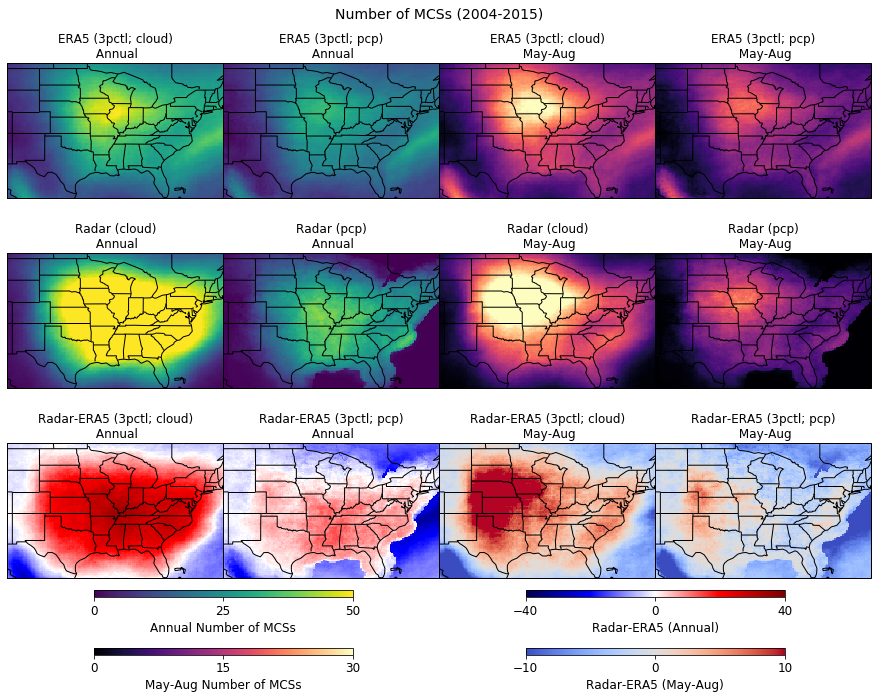

In [7]:
# era5
era5_3pctl_cld = xr.open_mfdataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_3pctl/mcs_stats_cloudtracknumber_*.nc',
                                  combine='by_coords')['tracked_total_grid']
era5_3pctl_pcp = xr.open_mfdataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_3pctl/mcs_stats_pcptracknumber_*.nc',
                                  combine='by_coords')['tracked_total_grid']
# imerg
imerg_cld = xr.open_mfdataset(f'{main_path_era}/dl_files/1H/mcs_stats_cloudtracknumber_*.nc',
                                  combine='by_coords')['tracked_total_grid']
imerg_pcp = xr.open_mfdataset(f'{main_path_era}/dl_files/1H/mcs_stats_pcptracknumber_*.nc',
                                  combine='by_coords')['tracked_total_grid']

vmin1 = 0
vmax1 = 50
cmap1 = "viridis"

vmin2 = 0
vmax2 = 30
cmap2 = "magma"

vmin3 = -40
vmax3 = 40
cmap3 = "seismic"

vmin4 = -10
vmax4 = 10
cmap4 = "coolwarm"

# create fig
fig = plt.figure(figsize=(12.,8.))

# create plots
fig.suptitle("Number of MCSs (2004-2015)", fontsize=14, y=1.)


ax1 = fig.add_axes([0.0, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax1.set_title('ERA5 (3pctl; cloud)\n Annual', fontsize=12)
ax1.pcolormesh(era5_3pctl_cld['lon'], era5_3pctl_cld['lat'], 
               era5_3pctl_cld.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax1.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax1.add_feature(cf.BORDERS)
ax1.margins(x=0,y=0)
ax1.coastlines()


ax2 = fig.add_axes([0.25, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax2.set_title('ERA5 (3pctl; pcp)\n Annual', fontsize=12)
ax2.pcolormesh(era5_3pctl_pcp['lon'], era5_3pctl_pcp['lat'], 
               era5_3pctl_pcp.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax2.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax2.add_feature(cf.BORDERS)
ax2.margins(x=0,y=0)
ax2.coastlines()


ax3 = fig.add_axes([0.5, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax3.set_title('ERA5 (3pctl; cloud)\n May-Aug', fontsize=12)
ax3.pcolormesh(era5_3pctl_cld['lon'], era5_3pctl_cld['lat'], 
               era5_3pctl_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax3.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax3.add_feature(cf.BORDERS)
ax3.margins(x=0,y=0)
ax3.coastlines()


ax4 = fig.add_axes([0.75, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax4.set_title('ERA5 (3pctl; pcp)\n May-Aug', fontsize=12)
ax4.pcolormesh(era5_3pctl_pcp['lon'], era5_3pctl_pcp['lat'], 
               era5_3pctl_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax4.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax4.add_feature(cf.BORDERS)
ax4.margins(x=0,y=0)
ax4.coastlines()



ax5 = fig.add_axes([0.0, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax5.set_title('Radar (cloud)\n Annual', fontsize=12)
ax5.pcolormesh(imerg_cld['lon'], imerg_cld['lat'], 
               imerg_cld.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax5.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax5.add_feature(cf.BORDERS)
ax5.margins(x=0,y=0)
ax5.coastlines()


ax6 = fig.add_axes([0.25, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax6.set_title('Radar (pcp)\n Annual', fontsize=12)
ax6.pcolormesh(imerg_pcp['lon'], imerg_pcp['lat'], 
                imerg_pcp.sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax6.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax6.add_feature(cf.BORDERS)
ax6.margins(x=0,y=0)
ax6.coastlines()


ax7 = fig.add_axes([0.5, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax7.set_title('Radar (cloud)\n May-Aug', fontsize=12)
ax7.pcolormesh(imerg_cld['lon'], imerg_cld['lat'], 
                imerg_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax7.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax7.add_feature(cf.BORDERS)
ax7.margins(x=0,y=0)
ax7.coastlines()


ax8 = fig.add_axes([0.75, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax8.set_title('Radar (pcp)\n May-Aug', fontsize=12)
ax8.pcolormesh(imerg_pcp['lon'], imerg_pcp['lat'], 
                imerg_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax8.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax8.add_feature(cf.BORDERS)
ax8.margins(x=0,y=0)
ax8.coastlines()




ax9 = fig.add_axes([0.0, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax9.set_title('Radar-ERA5 (3pctl; cloud)\n Annual', fontsize=12)
ax9.pcolormesh(imerg_cld['lon'], imerg_cld['lat'], 
               imerg_cld.sum(dim='month').mean(dim='year').values-era5_3pctl_cld.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin3, vmax=vmax3, cmap=cmap3)
ax9.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax9.add_feature(cf.BORDERS)
ax9.margins(x=0,y=0)
ax9.coastlines()


ax10 = fig.add_axes([0.25, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax10.set_title('Radar-ERA5 (3pctl; pcp)\n Annual', fontsize=12)
ax10.pcolormesh(imerg_pcp['lon'], imerg_pcp['lat'], 
                imerg_pcp.sum(dim='month').mean(dim='year').values-era5_3pctl_pcp.sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin3, vmax=vmax3, cmap=cmap3)
ax10.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax10.add_feature(cf.BORDERS)
ax10.margins(x=0,y=0)
ax10.coastlines()


ax11 = fig.add_axes([0.5, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax11.set_title('Radar-ERA5 (3pctl; cloud)\n May-Aug', fontsize=12)
ax11.pcolormesh(imerg_cld['lon'], imerg_cld['lat'], 
                imerg_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values-\
                era5_3pctl_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin4, vmax=vmax4, cmap=cmap4)
ax11.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax11.add_feature(cf.BORDERS)
ax11.margins(x=0,y=0)
ax11.coastlines()


ax12 = fig.add_axes([0.75, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax12.set_title('Radar-ERA5 (3pctl; pcp)\n May-Aug', fontsize=12)
ax12.pcolormesh(imerg_pcp['lon'], imerg_pcp['lat'], 
                imerg_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values-\
                era5_3pctl_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values,
                transform=ccrs.PlateCarree(), vmin=vmin4, vmax=vmax4, cmap=cmap4)
ax12.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax12.add_feature(cf.BORDERS)
ax12.margins(x=0,y=0)
ax12.coastlines()




# cbar
cbar_ax = fig.add_axes([0.1, -0.025, 0.3, 0.0125])
bounds = [vmin1,vmax1*0.5,vmax1]
newnorm=mpl.colors.Normalize(vmin=vmin1, vmax=vmax1)
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=plt.cm.get_cmap(cmap1),
                                 norm=newnorm,
                                 ticks=bounds,
                                 orientation='horizontal')
cbar.set_label('Annual Number of MCSs', fontsize=12) 
cbar.ax.tick_params(labelsize=12)

cbar_ax = fig.add_axes([0.1, -0.125, 0.3, 0.0125])
bounds = [vmin2,vmax2*0.5,vmax2]
newnorm=mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=plt.cm.get_cmap(cmap2),
                                 norm=newnorm,
                                 ticks=bounds,
                                 orientation='horizontal')
cbar.set_label('May-Aug Number of MCSs', fontsize=12) 
cbar.ax.tick_params(labelsize=12)

cbar_ax = fig.add_axes([0.6, -0.025, 0.3, 0.0125])
bounds = [vmin3,0,vmax3]
newnorm=mpl.colors.Normalize(vmin=vmin3, vmax=vmax3)
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=plt.cm.get_cmap(cmap3),
                                 norm=newnorm,
                                 ticks=bounds,
                                 orientation='horizontal')
cbar.set_label('Radar-ERA5 (Annual)', fontsize=12) 
cbar.ax.tick_params(labelsize=12)

cbar_ax = fig.add_axes([0.6, -0.125, 0.3, 0.0125])
bounds = [vmin4,0,vmax4]
newnorm=mpl.colors.Normalize(vmin=vmin4, vmax=vmax4)
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=plt.cm.get_cmap(cmap4),
                                 norm=newnorm,
                                 ticks=bounds,
                                 orientation='horizontal')
cbar.set_label('Radar-ERA5 (May-Aug)', fontsize=12) 
cbar.ax.tick_params(labelsize=12)

plt.savefig('/glade/work/molina/DATA/temp_figs/mcs_compare_fig3.png', bbox_inches='tight', dpi=200)
plt.show()

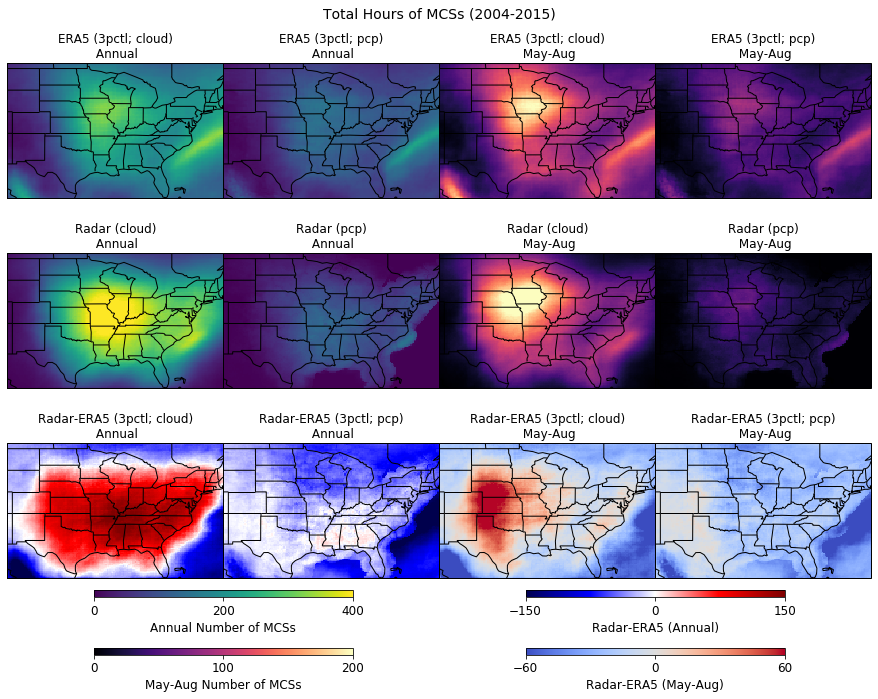

In [8]:
# era5
era5_3pctl_cld = xr.open_mfdataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_3pctl/mcs_stats_cloudtracknumber_*.nc',
                                  combine='by_coords')['nontracked_total_grid']
era5_3pctl_pcp = xr.open_mfdataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_3pctl/mcs_stats_pcptracknumber_*.nc',
                                  combine='by_coords')['nontracked_total_grid']
# imerg
imerg_cld = xr.open_mfdataset(f'{main_path_era}/dl_files/1H/mcs_stats_cloudtracknumber_*.nc',
                                  combine='by_coords')['nontracked_total_grid']
imerg_pcp = xr.open_mfdataset(f'{main_path_era}/dl_files/1H/mcs_stats_pcptracknumber_*.nc',
                                  combine='by_coords')['nontracked_total_grid']

vmin1 = 0
vmax1 = 400
cmap1 = "viridis"

vmin2 = 0
vmax2 = 200
cmap2 = "magma"

vmin3 = -150
vmax3 = 150
cmap3 = "seismic"

vmin4 = -60
vmax4 = 60
cmap4 = "coolwarm"

# create fig
fig = plt.figure(figsize=(12.,8.))

# create plots
fig.suptitle("Total Hours of MCSs (2004-2015)", fontsize=14, y=1.)


ax1 = fig.add_axes([0.0, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax1.set_title('ERA5 (3pctl; cloud)\n Annual', fontsize=12)
ax1.pcolormesh(era5_3pctl_cld['lon'], era5_3pctl_cld['lat'], 
               era5_3pctl_cld.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax1.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax1.add_feature(cf.BORDERS)
ax1.margins(x=0,y=0)
ax1.coastlines()


ax2 = fig.add_axes([0.25, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax2.set_title('ERA5 (3pctl; pcp)\n Annual', fontsize=12)
ax2.pcolormesh(era5_3pctl_pcp['lon'], era5_3pctl_pcp['lat'], 
               era5_3pctl_pcp.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax2.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax2.add_feature(cf.BORDERS)
ax2.margins(x=0,y=0)
ax2.coastlines()


ax3 = fig.add_axes([0.5, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax3.set_title('ERA5 (3pctl; cloud)\n May-Aug', fontsize=12)
ax3.pcolormesh(era5_3pctl_cld['lon'], era5_3pctl_cld['lat'], 
               era5_3pctl_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax3.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax3.add_feature(cf.BORDERS)
ax3.margins(x=0,y=0)
ax3.coastlines()


ax4 = fig.add_axes([0.75, 0.66, 0.25, 0.25], projection=ccrs.PlateCarree())
ax4.set_title('ERA5 (3pctl; pcp)\n May-Aug', fontsize=12)
ax4.pcolormesh(era5_3pctl_pcp['lon'], era5_3pctl_pcp['lat'], 
               era5_3pctl_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax4.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax4.add_feature(cf.BORDERS)
ax4.margins(x=0,y=0)
ax4.coastlines()



ax5 = fig.add_axes([0.0, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax5.set_title('Radar (cloud)\n Annual', fontsize=12)
ax5.pcolormesh(imerg_cld['lon'], imerg_cld['lat'], 
               imerg_cld.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax5.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax5.add_feature(cf.BORDERS)
ax5.margins(x=0,y=0)
ax5.coastlines()


ax6 = fig.add_axes([0.25, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax6.set_title('Radar (pcp)\n Annual', fontsize=12)
ax6.pcolormesh(imerg_pcp['lon'], imerg_pcp['lat'], 
                imerg_pcp.sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin1, vmax=vmax1, cmap=cmap1)
ax6.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax6.add_feature(cf.BORDERS)
ax6.margins(x=0,y=0)
ax6.coastlines()


ax7 = fig.add_axes([0.5, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax7.set_title('Radar (cloud)\n May-Aug', fontsize=12)
ax7.pcolormesh(imerg_cld['lon'], imerg_cld['lat'], 
                imerg_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax7.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax7.add_feature(cf.BORDERS)
ax7.margins(x=0,y=0)
ax7.coastlines()


ax8 = fig.add_axes([0.75, 0.33, 0.25, 0.25], projection=ccrs.PlateCarree())
ax8.set_title('Radar (pcp)\n May-Aug', fontsize=12)
ax8.pcolormesh(imerg_pcp['lon'], imerg_pcp['lat'], 
                imerg_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin2, vmax=vmax2, cmap=cmap2)
ax8.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax8.add_feature(cf.BORDERS)
ax8.margins(x=0,y=0)
ax8.coastlines()



ax9 = fig.add_axes([0.0, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax9.set_title('Radar-ERA5 (3pctl; cloud)\n Annual', fontsize=12)
ax9.pcolormesh(imerg_cld['lon'], imerg_cld['lat'], 
               imerg_cld.sum(dim='month').mean(dim='year').values-
               era5_3pctl_cld.sum(dim='month').mean(dim='year').values, 
               transform=ccrs.PlateCarree(), vmin=vmin3, vmax=vmax3, cmap=cmap3)
ax9.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax9.add_feature(cf.BORDERS)
ax9.margins(x=0,y=0)
ax9.coastlines()


ax10 = fig.add_axes([0.25, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax10.set_title('Radar-ERA5 (3pctl; pcp)\n Annual', fontsize=12)
ax10.pcolormesh(imerg_pcp['lon'], imerg_pcp['lat'], 
                imerg_pcp.sum(dim='month').mean(dim='year').values-
                era5_3pctl_pcp.sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin3, vmax=vmax3, cmap=cmap3)
ax10.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax10.add_feature(cf.BORDERS)
ax10.margins(x=0,y=0)
ax10.coastlines()


ax11 = fig.add_axes([0.5, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax11.set_title('Radar-ERA5 (3pctl; cloud)\n May-Aug', fontsize=12)
ax11.pcolormesh(imerg_cld['lon'], imerg_cld['lat'], 
                imerg_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values-
                era5_3pctl_cld.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin4, vmax=vmax4, cmap=cmap4)
ax11.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax11.add_feature(cf.BORDERS)
ax11.margins(x=0,y=0)
ax11.coastlines()


ax12 = fig.add_axes([0.75, 0., 0.25, 0.25], projection=ccrs.PlateCarree())
ax12.set_title('Radar-ERA5 (3pctl; pcp)\n May-Aug', fontsize=12)
ax12.pcolormesh(imerg_pcp['lon'], imerg_pcp['lat'], 
                imerg_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values-
                era5_3pctl_pcp.sel(month=slice(5,8)).sum(dim='month').mean(dim='year').values, 
                transform=ccrs.PlateCarree(), vmin=vmin4, vmax=vmax4, cmap=cmap4)
ax12.add_feature(STATES, facecolor='none', edgecolor='k', zorder=30)
ax12.add_feature(cf.BORDERS)
ax12.margins(x=0,y=0)
ax12.coastlines()



# cbar
cbar_ax = fig.add_axes([0.1, -0.025, 0.3, 0.0125])
bounds = [vmin1,vmax1*0.5,vmax1]
newnorm=mpl.colors.Normalize(vmin=vmin1, vmax=vmax1)
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=plt.cm.get_cmap(cmap1),
                                 norm=newnorm,
                                 ticks=bounds,
                                 orientation='horizontal')
cbar.set_label('Annual Number of MCSs', fontsize=12) 
cbar.ax.tick_params(labelsize=12)

cbar_ax = fig.add_axes([0.1, -0.125, 0.3, 0.0125])
bounds = [vmin2,vmax2*0.5,vmax2]
newnorm=mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=plt.cm.get_cmap(cmap2),
                                 norm=newnorm,
                                 ticks=bounds,
                                 orientation='horizontal')
cbar.set_label('May-Aug Number of MCSs', fontsize=12) 
cbar.ax.tick_params(labelsize=12)

cbar_ax = fig.add_axes([0.6, -0.025, 0.3, 0.0125])
bounds = [vmin3,0,vmax3]
newnorm=mpl.colors.Normalize(vmin=vmin3, vmax=vmax3)
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=plt.cm.get_cmap(cmap3),
                                 norm=newnorm,
                                 ticks=bounds,
                                 orientation='horizontal')
cbar.set_label('Radar-ERA5 (Annual)', fontsize=12) 
cbar.ax.tick_params(labelsize=12)

cbar_ax = fig.add_axes([0.6, -0.125, 0.3, 0.0125])
bounds = [vmin4,0,vmax4]
newnorm=mpl.colors.Normalize(vmin=vmin4, vmax=vmax4)
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=plt.cm.get_cmap(cmap4),
                                 norm=newnorm,
                                 ticks=bounds,
                                 orientation='horizontal')
cbar.set_label('Radar-ERA5 (May-Aug)', fontsize=12) 
cbar.ax.tick_params(labelsize=12)

plt.savefig('/glade/work/molina/DATA/temp_figs/mcs_compare_fig5.png', bbox_inches='tight', dpi=200)
plt.show()

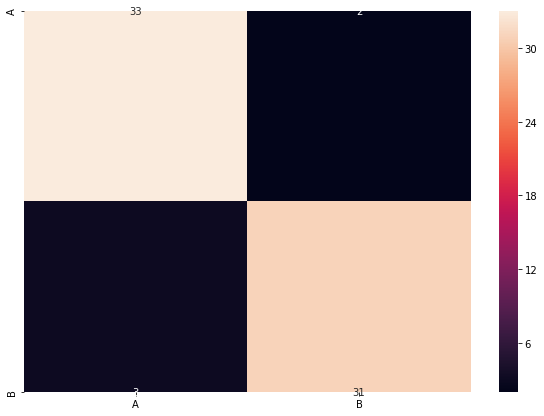

In [211]:
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt
array = [[33,2], 
         [3,31]]
df_cm = pd.DataFrame(array, index = [i for i in "AB"],
                     columns = [i for i in "AB"])
plt.figure(figsize = (10,7))
sn.heatmap(df_cm, annot=True)

In [212]:
from sklearn.metrics import confusion_matrix

In [144]:
ax1[0].plot(era5_3pctl_cld.sum(dim='month').mean(dim='year').values)
plt.show()

In [141]:
era5_3pctl_cld.sum(dim='month').mean(dim='year').values.shape

(101, 161)

In [3]:
import xarray as xr
import matplotlib.pyplot as plt

In [4]:
ds = xr.open_dataset('/glade/scratch/molina/cesm_mcs/cesm_era5/dl_files/1H/mcs_stats_cloudtracknumber_2005.nc')

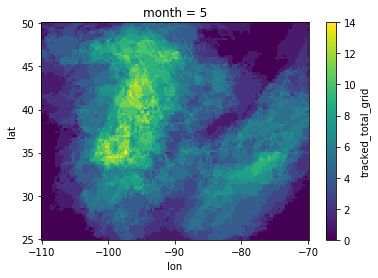

In [8]:
ds['tracked_total_grid'].sel(month=5).plot.pcolormesh('lon', 'lat')

In [44]:
import matplotlib.pyplot as plt


In [54]:
lat[:-4,:].shape

(101, 161)

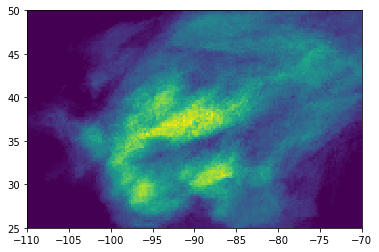

In [55]:
plt.pcolormesh(lon[:-4,:], lat[:-4,:], np.nanmean(masks[:,:-4,:], axis=0)); plt.show()

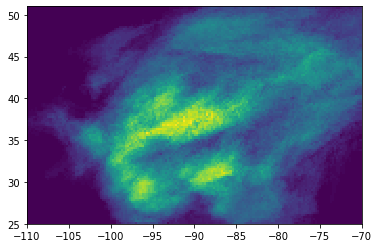

In [50]:
plt.pcolormesh(lon, lat, np.nanmean(masks[:,:,:], axis=0)); plt.show()

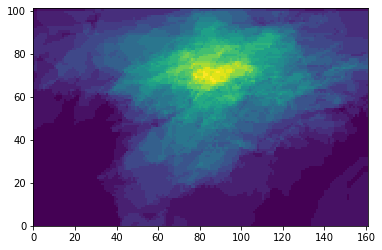

In [18]:
import matplotlib.pyplot as plt
plt.pcolormesh(mcsstat.tracked_total_grid(masks[np.argwhere(mons==5)[:,0],:,:])); plt.show()

In [36]:
mcsstat.tracked_total_grid(masks[np.argwhere(mons==10)[:,0],:,:])

array([[1., 2., 2., ..., 0., 0., 0.],
       [2., 2., 2., ..., 0., 0., 0.],
       [2., 2., 2., ..., 0., 0., 0.],
       ...,
       [1., 1., 1., ..., 2., 2., 2.],
       [1., 1., 1., ..., 2., 2., 2.],
       [0., 0., 0., ..., 1., 1., 2.]])

In [68]:
ma_nottracked[7].max()

129.0

In [55]:
for m in np.arange(0,12,1):
    print(mcsstat.tracked_total(masks[np.argwhere(mons==m+1)[:,0],:,:]))

0
0
13
27
44
63
60
62
21
26
0
0


In [71]:
len(np.unique(masks[masks > 0]))

306

In [8]:
import xarray as xr
ds = xr.open_dataset(f'/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_3pctl/2004/mcstrack_20040701_0800.nc')

In [9]:
ds

<xarray.Dataset>
Dimensions:               (lat: 121, lon: 321, time: 1)
Coordinates:
  * time                  (time) datetime64[ns] 2004-07-01T08:00:00
  * lon                   (lon) float32 220.0 220.25 220.5 ... 299.75 300.0
  * lat                   (lat) float32 20.0 20.25 20.5 ... 49.5 49.75 50.0
Data variables:
    base_time             (time) datetime64[ns] ...
    julian_day            (time) float64 ...
    longitude             (lat, lon) float32 ...
    latitude              (lat, lon) float32 ...
    numclouds             (time) int32 ...
    tb                    (time, lat, lon) float32 ...
    precipitation         (time, lat, lon) float32 ...
    cloudtype             (time, lat, lon) float32 ...
    convcold_cloudnumber  (time, lat, lon) float32 ...
    cloudnumber           (time, lat, lon) float64 ...
    cloudtracknumber      (time, lat, lon) float64 ...
    pcptracknumber        (time, lat, lon) float64 ...
Attributes:
    title:       Robust MCS pixel-level tracking final output data
    comment1:    cloudtracknumber labels all cold cloud pixels identified as ...
    comment2:    tb, precipitation are full fields, use cloudtracknumber, pcp...
    startdate:   20040301
    enddate:     20041031
    contact:     Zhe Feng: zhe.feng@pnnl.gov
    created_on:  Thu Nov  5 12:26:44 2020

In [11]:
ds['time'].dt.month.values

array([7])

In [24]:
import xarray as xr
import numpy as np

In [ ]:
# open one regridded mask from imerg
# use imerg regridded to slice the era5 mask
# 

In [13]:
mask = xr.open_dataset('/glade/scratch/molina/cesm_mcs/cesm_era5/dl_files/3H/mask_cloudtracknumber_ID4517.nc')

In [78]:
mask['cloudtracknumber'][:,:-4,:]

<xarray.DataArray 'cloudtracknumber' (time: 1, y: 101, x: 161)>
array([[[0., 0., ..., 0., 0.],
        [0., 0., ..., 0., 0.],
        ...,
        [0., 0., ..., 0., 0.],
        [0., 0., ..., 0., 0.]]])
Coordinates:
  * time     (time) datetime64[ns] 2005-07-24T09:00:00
    lon      (y, x) float64 -110.0 -109.8 -109.5 -109.2 ... -70.5 -70.25 -70.0
    lat      (y, x) float64 25.0 25.0 25.0 25.0 25.0 ... 50.0 50.0 50.0 50.0
Dimensions without coordinates: y, x
Attributes:
    regrid_method:  nearest_s2d

In [66]:
mask['lon'][:-4,:]

<xarray.DataArray 'lon' (y: 101, x: 161)>
array([[-110.  , -109.75, -109.5 , ...,  -70.5 ,  -70.25,  -70.  ],
       [-110.  , -109.75, -109.5 , ...,  -70.5 ,  -70.25,  -70.  ],
       [-110.  , -109.75, -109.5 , ...,  -70.5 ,  -70.25,  -70.  ],
       ...,
       [-110.  , -109.75, -109.5 , ...,  -70.5 ,  -70.25,  -70.  ],
       [-110.  , -109.75, -109.5 , ...,  -70.5 ,  -70.25,  -70.  ],
       [-110.  , -109.75, -109.5 , ...,  -70.5 ,  -70.25,  -70.  ]])
Coordinates:
    lon      (y, x) float64 -110.0 -109.8 -109.5 -109.2 ... -70.5 -70.25 -70.0
    lat      (y, x) float64 25.0 25.0 25.0 25.0 25.0 ... 50.0 50.0 50.0 50.0
Dimensions without coordinates: y, x

In [22]:
mask['cloudtracknumber'].isel(time=0)['lon'][0,:]
#mask['cloudtracknumber'].isel(time=0)['lat'][:,0]

<xarray.DataArray 'lon' (x: 161)>
array([-110.  , -109.75, -109.5 , -109.25, -109.  , -108.75, -108.5 , -108.25,
       -108.  , -107.75, -107.5 , -107.25, -107.  , -106.75, -106.5 , -106.25,
       -106.  , -105.75, -105.5 , -105.25, -105.  , -104.75, -104.5 , -104.25,
       -104.  , -103.75, -103.5 , -103.25, -103.  , -102.75, -102.5 , -102.25,
       -102.  , -101.75, -101.5 , -101.25, -101.  , -100.75, -100.5 , -100.25,
       -100.  ,  -99.75,  -99.5 ,  -99.25,  -99.  ,  -98.75,  -98.5 ,  -98.25,
        -98.  ,  -97.75,  -97.5 ,  -97.25,  -97.  ,  -96.75,  -96.5 ,  -96.25,
        -96.  ,  -95.75,  -95.5 ,  -95.25,  -95.  ,  -94.75,  -94.5 ,  -94.25,
        -94.  ,  -93.75,  -93.5 ,  -93.25,  -93.  ,  -92.75,  -92.5 ,  -92.25,
        -92.  ,  -91.75,  -91.5 ,  -91.25,  -91.  ,  -90.75,  -90.5 ,  -90.25,
        -90.  ,  -89.75,  -89.5 ,  -89.25,  -89.  ,  -88.75,  -88.5 ,  -88.25,
        -88.  ,  -87.75,  -87.5 ,  -87.25,  -87.  ,  -86.75,  -86.5 ,  -86.25,
        -86.  ,  -85.75,  -85.5 ,  -85.25,  -85.  ,  -84.75,  -84.5 ,  -84.25,
        -84.  ,  -83.75,  -83.5 ,  -83.25,  -83.  ,  -82.75,  -82.5 ,  -82.25,
        -82.  ,  -81.75,  -81.5 ,  -81.25,  -81.  ,  -80.75,  -80.5 ,  -80.25,
        -80.  ,  -79.75,  -79.5 ,  -79.25,  -79.  ,  -78.75,  -78.5 ,  -78.25,
        -78.  ,  -77.75,  -77.5 ,  -77.25,  -77.  ,  -76.75,  -76.5 ,  -76.25,
        -76.  ,  -75.75,  -75.5 ,  -75.25,  -75.  ,  -74.75,  -74.5 ,  -74.25,
        -74.  ,  -73.75,  -73.5 ,  -73.25,  -73.  ,  -72.75,  -72.5 ,  -72.25,
        -72.  ,  -71.75,  -71.5 ,  -71.25,  -71.  ,  -70.75,  -70.5 ,  -70.25,
        -70.  ])
Coordinates:
    time     datetime64[ns] 2005-07-24T09:00:00
    lon      (x) float64 -110.0 -109.8 -109.5 -109.2 ... -70.5 -70.25 -70.0
    lat      (x) float64 25.0 25.0 25.0 25.0 25.0 ... 25.0 25.0 25.0 25.0 25.0
Dimensions without coordinates: x

In [25]:
lat0_bnd = int(np.around(mask['lat'].min(skipna=True).values))
lat1_bnd = int(np.around(mask['lat'].max(skipna=True).values))
lon0_bnd = int(np.around(mask['lon'].min(skipna=True).values))
lon1_bnd = int(np.around(mask['lon'].max(skipna=True).values))

In [50]:
lat0_bnd

25

In [51]:
lat1_bnd

51

In [52]:
lon0_bnd

-110

In [53]:
lon1_bnd

-70

In [8]:
ds = xr.open_mfdataset('/glade/scratch/molina/cesm_mcs/mcs_flextrkr_era5/mcstracking_3pctl/2004/mcstrack_2004*.nc', 
                       combine='by_coords')

In [12]:
ds

,Array,Chunk
Bytes,47.04 kB,8 B
Shape,"(5880,)","(1,)"
Count,17640 Tasks,5880 Chunks
Type,datetime64[ns],numpy.ndarray


In [48]:
data = ds.isel(lat=slice(np.where(ds['lat'].values==lat0_bnd)[0][0],
                         np.where(ds['lat'].values==lat1_bnd)[0][0]+1),
               lon=slice(np.where(ds['lon'].values==lon0_bnd+360)[0][0],
                         np.where(ds['lon'].values==lon1_bnd+360)[0][0]+1))

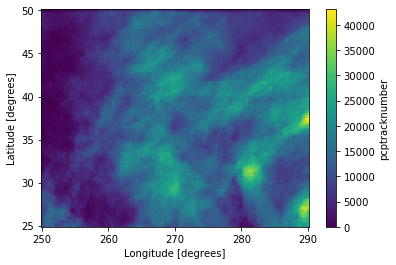

In [115]:
data['pcptracknumber'].sum(dim=['time']).plot.pcolormesh();

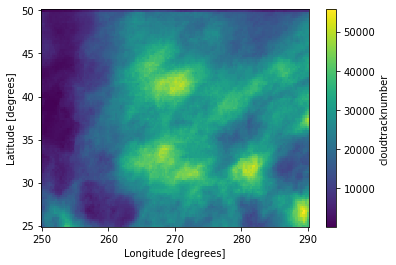

In [116]:
data['cloudtracknumber'].sum(dim=['time']).plot.pcolormesh();

In [118]:
data['lon']

<xarray.DataArray 'lon' (lon: 161)>
array([250.  , 250.25, 250.5 , 250.75, 251.  , 251.25, 251.5 , 251.75, 252.  ,
       252.25, 252.5 , 252.75, 253.  , 253.25, 253.5 , 253.75, 254.  , 254.25,
       254.5 , 254.75, 255.  , 255.25, 255.5 , 255.75, 256.  , 256.25, 256.5 ,
       256.75, 257.  , 257.25, 257.5 , 257.75, 258.  , 258.25, 258.5 , 258.75,
       259.  , 259.25, 259.5 , 259.75, 260.  , 260.25, 260.5 , 260.75, 261.  ,
       261.25, 261.5 , 261.75, 262.  , 262.25, 262.5 , 262.75, 263.  , 263.25,
       263.5 , 263.75, 264.  , 264.25, 264.5 , 264.75, 265.  , 265.25, 265.5 ,
       265.75, 266.  , 266.25, 266.5 , 266.75, 267.  , 267.25, 267.5 , 267.75,
       268.  , 268.25, 268.5 , 268.75, 269.  , 269.25, 269.5 , 269.75, 270.  ,
       270.25, 270.5 , 270.75, 271.  , 271.25, 271.5 , 271.75, 272.  , 272.25,
       272.5 , 272.75, 273.  , 273.25, 273.5 , 273.75, 274.  , 274.25, 274.5 ,
       274.75, 275.  , 275.25, 275.5 , 275.75, 276.  , 276.25, 276.5 , 276.75,
       277.  , 277.25, 277.5 , 277.75, 278.  , 278.25, 278.5 , 278.75, 279.  ,
       279.25, 279.5 , 279.75, 280.  , 280.25, 280.5 , 280.75, 281.  , 281.25,
       281.5 , 281.75, 282.  , 282.25, 282.5 , 282.75, 283.  , 283.25, 283.5 ,
       283.75, 284.  , 284.25, 284.5 , 284.75, 285.  , 285.25, 285.5 , 285.75,
       286.  , 286.25, 286.5 , 286.75, 287.  , 287.25, 287.5 , 287.75, 288.  ,
       288.25, 288.5 , 288.75, 289.  , 289.25, 289.5 , 289.75, 290.  ],
      dtype=float32)
Coordinates:
  * lon      (lon) float32 250.0 250.25 250.5 250.75 ... 289.5 289.75 290.0
Attributes:
    long_name:  Longitude
    units:      degrees

In [46]:
np.where(ds['lat'].values==lat0_bnd)[0][0]+1

21

In [47]:
lat0_bnd

25